# Importing necessary Modules

In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [85]:
import seaborn as sns

In [86]:
from scipy.stats import norm, probplot

In [87]:
from copy import copy

In [174]:
from sklearn.feature_selection import VarianceThreshold

In [89]:
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor

In [178]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [202]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [247]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [267]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from scipy.stats import randint

# Initializing the dataset and .names file

In [90]:
df = pd.read_csv("OnlineNewsPopularity.csv")
with open("OnlineNewsPopularity.names") as f:
    print(f.read())

1. Title: Online News Popularity

2. Source Information
    -- Creators: Kelwin Fernandes (kafc ‘@’ inesctec.pt, kelwinfc ’@’ gmail.com),
                 Pedro Vinagre (pedro.vinagre.sousa ’@’ gmail.com) and
                 Pedro Sernadela
   -- Donor: Kelwin Fernandes (kafc ’@’ inesctec.pt, kelwinfc '@' gmail.com)
   -- Date: May, 2015

3. Past Usage:
    1. K. Fernandes, P. Vinagre and P. Cortez. A Proactive Intelligent Decision
       Support System for Predicting the Popularity of Online News. Proceedings
       of the 17th EPIA 2015 - Portuguese Conference on Artificial Intelligence,
       September, Coimbra, Portugal.

       -- Results: 
          -- Binary classification as popular vs unpopular using a decision
             threshold of 1400 social interactions.
          -- Experiments with different models: Random Forest (best model),
             Adaboost, SVM, KNN and Naïve Bayes.
          -- Recorded 67% of accuracy and 0.73 of AUC.
    - Predicted attribute: online ne

# Basic Information of Dataset

In [91]:
df.columns

Index([' url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sen

In [92]:
#Removing Space Character from Feature names
df.columns=df.columns.str.replace(" ","")

In [93]:
df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731,12,219,0.663594,1.0,0.815385,4,2,1,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731,9,255,0.604743,1.0,0.791946,3,1,1,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731,9,211,0.575130,1.0,0.663866,3,1,1,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731,9,531,0.503788,1.0,0.665635,9,0,1,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731,13,1072,0.415646,1.0,0.540890,19,19,20,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [94]:
df.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,...,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,214.163767,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,...,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,164.000000,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.328383,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,339.000000,10.000000,409.000000,0.539226,1.000000,0.690476,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,542.000000,12.000000,716.000000,0.608696,1.000000,0.754630,14.000000,4.000000,4.000000,1.000000,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,2800.000000
max,731.000000,23.000000,8474.000000,701.000000,1042.000000,650.000000,304.000000,116.000000,128.000000,91.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


From above description we can clearly see that this data needs to be normalized so that we can apply ML models for greater precision and accuracy

In [95]:
df.shape

(39644, 61)

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   url                            39644 non-null  object 
 1   timedelta                      39644 non-null  int64  
 2   n_tokens_title                 39644 non-null  int64  
 3   n_tokens_content               39644 non-null  int64  
 4   n_unique_tokens                39644 non-null  float64
 5   n_non_stop_words               39644 non-null  float64
 6   n_non_stop_unique_tokens       39644 non-null  float64
 7   num_hrefs                      39644 non-null  int64  
 8   num_self_hrefs                 39644 non-null  int64  
 9   num_imgs                       39644 non-null  int64  
 10  num_videos                     39644 non-null  int64  
 11  average_token_length           39644 non-null  float64
 12  num_keywords                   39644 non-null 

In [97]:
# Checking for any null values and displaying total null values(if any) per columns
df.isna().sum()

url                             0
timedelta                       0
n_tokens_title                  0
n_tokens_content                0
n_unique_tokens                 0
                               ..
title_subjectivity              0
title_sentiment_polarity        0
abs_title_subjectivity          0
abs_title_sentiment_polarity    0
shares                          0
Length: 61, dtype: int64

In [98]:
# Checking for any duplicates from the dataset
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
39639    False
39640    False
39641    False
39642    False
39643    False
Length: 39644, dtype: bool

In [99]:
df.dtypes

url                              object
timedelta                         int64
n_tokens_title                    int64
n_tokens_content                  int64
n_unique_tokens                 float64
                                 ...   
title_subjectivity              float64
title_sentiment_polarity        float64
abs_title_subjectivity          float64
abs_title_sentiment_polarity    float64
shares                            int64
Length: 61, dtype: object

# Data Processing

In [100]:
correlation_matrix = df.corr()
print(correlation_matrix)

                               timedelta  n_tokens_title  n_tokens_content  \
timedelta                       1.000000       -0.240320         -0.062867   
n_tokens_title                 -0.240320        1.000000          0.018160   
n_tokens_content               -0.062867        0.018160          1.000000   
n_unique_tokens                 0.002866       -0.005318         -0.004737   
n_non_stop_words                0.000089       -0.004754          0.017512   
n_non_stop_unique_tokens        0.003805       -0.005420          0.000373   
num_hrefs                      -0.000832       -0.053496          0.423065   
num_self_hrefs                  0.064530       -0.014856          0.304682   
num_imgs                       -0.027636       -0.008858          0.342600   
num_videos                      0.000936        0.051460          0.103699   
average_token_length            0.130465       -0.071403          0.167789   
num_keywords                    0.046884       -0.006077        

As we can see in OnlineNewsPopularity.names file we can see different columns for different days of the week as well as different data channels which is not necessary. We can have columns for data channel and weekdays which could display all the info. This will reduce the dimension and the improve the interpretation

In [101]:
# Merging the weekdays columns channels as one single column
publishdayMerge=df[['weekday_is_monday','weekday_is_tuesday','weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday','weekday_is_saturday' ,'weekday_is_sunday' ]]

weekday_arr=[]
for row in list(range(publishdayMerge.shape[0])):
    for col in list(range(publishdayMerge.shape[1])):
        if ((col==0) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Monday')
        elif ((col==1) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Tueday')
        elif ((col==2) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Wednesday')
        elif ((col==3) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Thursday')
        elif ((col==4) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Friday')
        elif ((col==5) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Saturday') 
        elif ((col==6) and (publishdayMerge.iloc[row,col])==1):
            weekday_arr.append('Sunday')

In [102]:
# Merging the data channels as one single column
DataChannelMerge=df[['data_channel_is_lifestyle','data_channel_is_entertainment' ,'data_channel_is_bus','data_channel_is_socmed' ,'data_channel_is_tech','data_channel_is_world' ]]

DataChannel_arr=[]
for row in list(range(DataChannelMerge.shape[0])):
    if (((DataChannelMerge.iloc[row,0])==0) and ((DataChannelMerge.iloc[row,1])==0) and ((DataChannelMerge.iloc[row,2])==0) and ((DataChannelMerge.iloc[row,3])==0) and ((DataChannelMerge.iloc[row,4])==0) and ((DataChannelMerge.iloc[row,5])==0)):
        DataChannel_arr.append('Others')
    for col in list(range(DataChannelMerge.shape[1])):
        if ((col==0) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Lifestyle')
        elif ((col==1) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Entertainment')
        elif ((col==2) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Business')
        elif ((col==3) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Social Media')
        elif ((col==4) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('Tech')
        elif ((col==5) and (DataChannelMerge.iloc[row,col])==1):
            DataChannel_arr.append('World')

In [103]:
# merge the the new data into the dataframe
df.insert(loc=11, column='weekdays', value=weekday_arr)
df.insert(loc=12, column='data_channel', value=DataChannel_arr)

# Now I drop the old data
# df.drop(labels=['data_channel_is_lifestyle','data_channel_is_entertainment' ,'data_channel_is_bus','data_channel_is_socmed' ,'data_channel_is_tech','data_channel_is_world', 'weekday_is_monday','weekday_is_tuesday','weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday','weekday_is_saturday' ,'weekday_is_sunday'], axis = 1, inplace=True)
print(df.shape)
df.head()

(39644, 63)


,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731,12,219,0.663594,1.0,0.815385,4,2,1,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731,9,255,0.604743,1.0,0.791946,3,1,1,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731,9,211,0.575130,1.0,0.663866,3,1,1,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731,9,531,0.503788,1.0,0.665635,9,0,1,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731,13,1072,0.415646,1.0,0.540890,19,19,20,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [104]:
df.columns

Index(['url', 'timedelta', 'n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos', 'weekdays',
       'data_channel', 'average_token_length', 'num_keywords',
       'data_channel_is_lifestyle', 'data_channel_is_entertainment',
       'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global

In [105]:
df.shape

(39644, 63)

In [106]:
df['n_tokens_content'].describe()

count    39644.000000
mean       546.514731
std        471.107508
min          0.000000
25%        246.000000
50%        409.000000
75%        716.000000
max       8474.000000
Name: n_tokens_content, dtype: float64

From what we can infer from the OnlineNewsPopularity.names file, n_tokens_contents contains the number of words in the article but as we can see above the min value is 0. If n_tokens_contents is 0 then the article doesnt contain any words and hence we can call these rows as noise. This would not help in prediction of popularity as it doesnt bring any info for it. So, we remove the rows.

In [107]:
words = df[df['n_tokens_content'] == 0].index
print('Articles with no words in it:-', words.size)

Articles with no words in it:- 1181


In total 1181 articles have no words and could be removed to reduce noise

In [108]:
df.drop(words, inplace=True)
df.shape

(38463, 63)

Also from the OnlineNewsPopularity.names we can see that url and timedelta do not contribute in final prediction because url contains the website link and as all the articles are from the same website this field is considered as noise. In the case of timedelta, it represents the gap of days between the publication of article to formation of dataset. 

In [109]:
df = df.drop(['url','timedelta'], axis=1)

<br>We cant remove the values of ones those are highly correlated.
<br>

<h3>Basic Understanding of target variable

In [110]:
share_data = df['shares']
df['shares'].describe()

count     38463.000000
mean       3355.360398
std       11585.968776
min           1.000000
25%         945.000000
50%        1400.000000
75%        2700.000000
max      843300.000000
Name: shares, dtype: float64

Here we convert the share variable into popularity variable by converting through the ranges using the percentiles from the describe function
<li>greater than 75 percentile - "High"
<li>between 50 to 75 percentile - "Good"
<li>between 25 to 50 percentile - "Average"
<li>less than 25 percentile - "Low"
<br><br>The above is done just for visualization purposes which is done by its class as of whole. This column will not be used in final prediction.

In [111]:
share_label = list()
for share in share_data:
    if share <= 945:
        share_label.append('Low')
    elif share > 945 and share <= 1400:
        share_label.append('Average')
    elif share > 1400 and share <= 2700:
        share_label.append('Good')
    else:
        share_label.append('High')
        
df = pd.concat([df, pd.DataFrame(share_label, columns=['popularity'])], axis=1)

In [112]:
df.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,weekdays,...,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,popularity
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,Monday,...,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593.0,Low
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,Monday,...,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711.0,Low
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,Monday,...,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500.0,Good
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,Monday,...,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200.0,Average
4,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,Monday,...,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505.0,Low


In [113]:
df.columns

Index(['n_tokens_title', 'n_tokens_content', 'n_unique_tokens',
       'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs',
       'num_self_hrefs', 'num_imgs', 'num_videos', 'weekdays', 'data_channel',
       'average_token_length', 'num_keywords', 'data_channel_is_lifestyle',
       'data_channel_is_entertainment', 'data_channel_is_bus',
       'data_channel_is_socmed', 'data_channel_is_tech',
       'data_channel_is_world', 'kw_min_min', 'kw_max_min', 'kw_avg_min',
       'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg',
       'kw_avg_avg', 'self_reference_min_shares', 'self_reference_max_shares',
       'self_reference_avg_sharess', 'weekday_is_monday', 'weekday_is_tuesday',
       'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday',
       'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend', 'LDA_00',
       'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'global_subjectivity',
       'global_sentiment_polarity', 'global_rate_positive_words

# Data Visualization

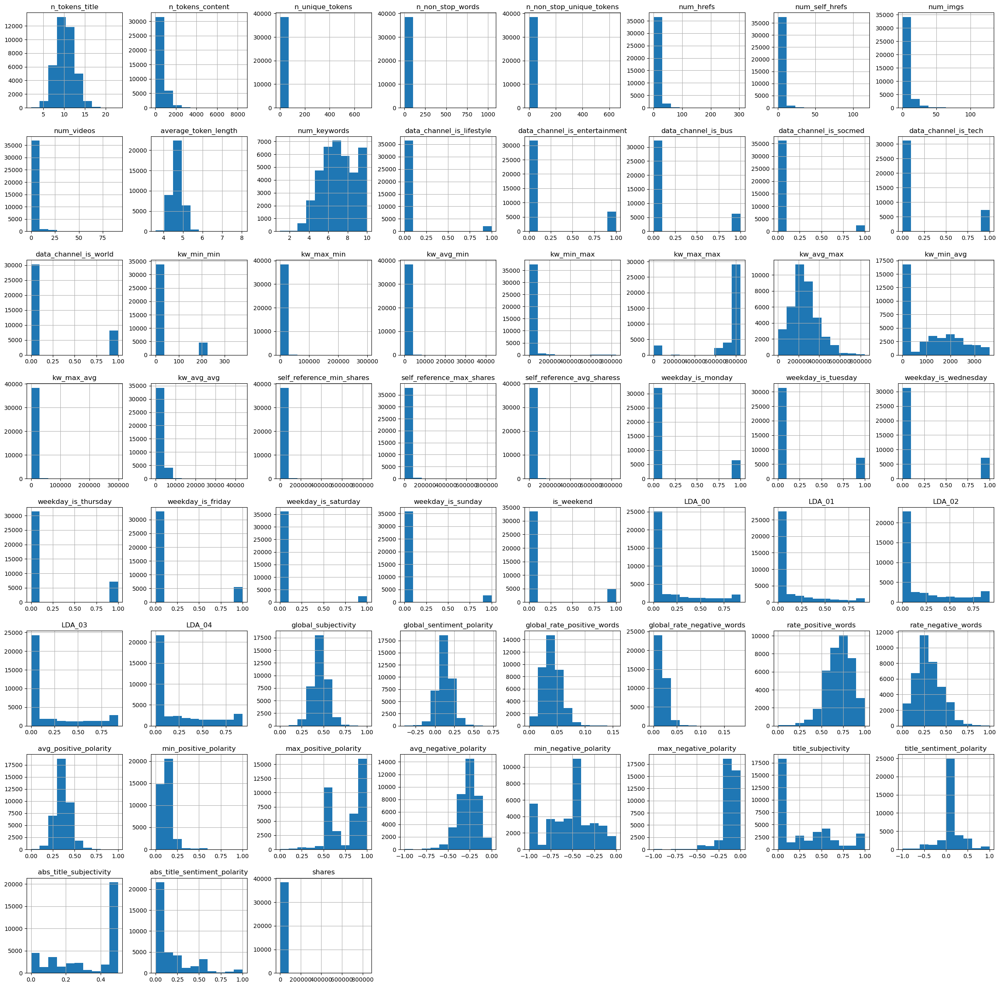

In [114]:
df.hist(figsize=(30,30))
plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_14500\1371974247.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  df_lt = cor.where(np.tril(np.ones(cor.shape)).astype(np.bool))


<AxesSubplot:>

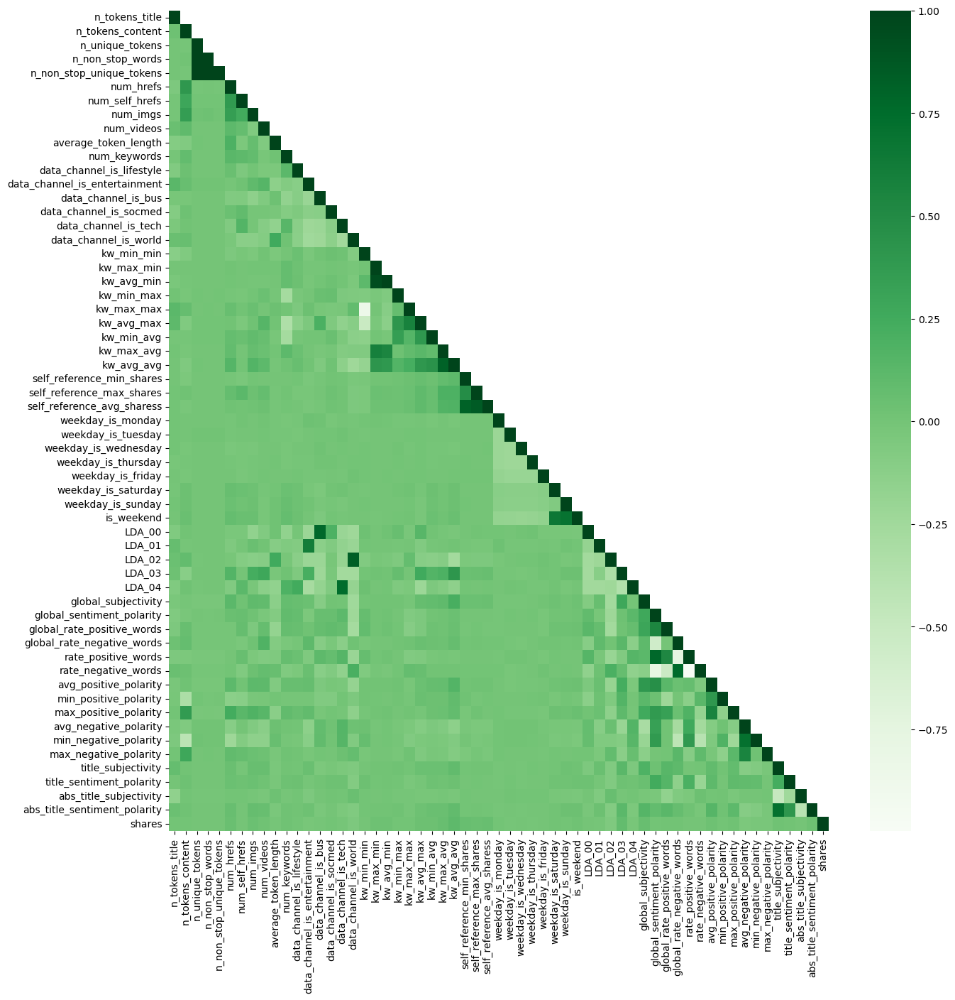

In [115]:
cor=df.corr()
plt.figure(figsize=(15,15))
df_lt = cor.where(np.tril(np.ones(cor.shape)).astype(np.bool))
sns.heatmap(df_lt,cmap='Greens')

By using Count pot below we check for the balance of classes in popularity attribute

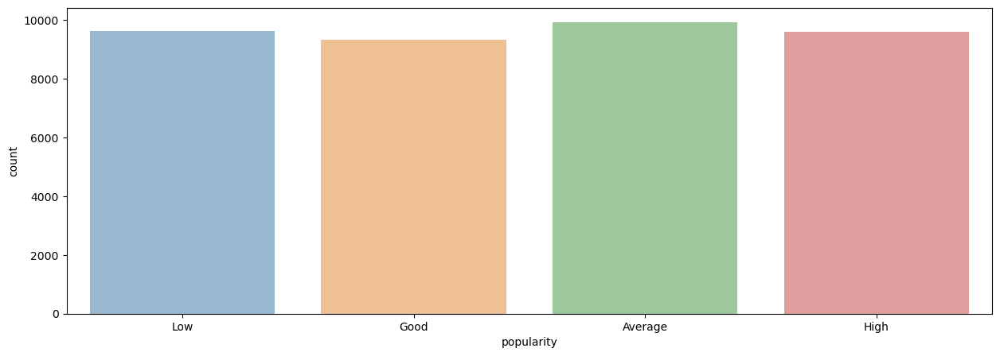

In [116]:
fig = plt.figure(figsize=(15,5))
ax = sns.countplot(x='popularity',data=df,alpha=0.5)

In [117]:
# Fetch the counts for each class
counts = df.groupby('popularity').size().reset_index()
counts.columns = ['Popularity','No of articles']
counts

,Popularity,No of articles
0,Average,9917
1,Good,9315
2,High,9597
3,Low,9634


In [118]:
df['n_non_stop_words'].describe()

count    38463.000000
mean         1.027065
std          5.307978
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max       1042.000000
Name: n_non_stop_words, dtype: float64

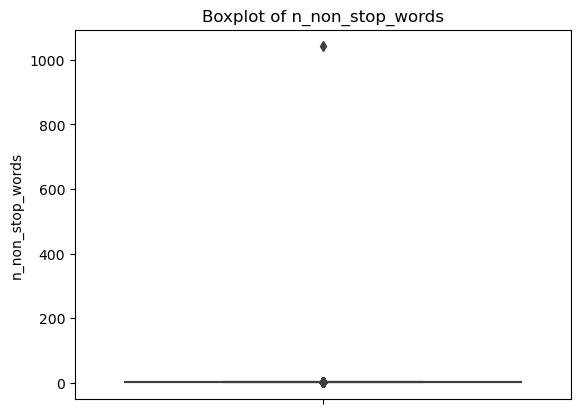

In [119]:
n_non_stop_words = df['n_non_stop_words']
sns.boxplot(y=n_non_stop_words)
plt.title('Boxplot of n_non_stop_words')
plt.show()

As we can see from the boxplot and describe function, 1042 is an outlier. So we remove the row

In [120]:
df = df[df['n_non_stop_words'] != 1042]

In [121]:
df = df.dropna()

In [122]:
df['n_non_stop_unique_tokens'].describe()

count    37407.000000
mean         0.693689
std          0.101076
min          0.119134
25%          0.632479
50%          0.694064
75%          0.757576
max          1.000000
Name: n_non_stop_unique_tokens, dtype: float64

<AxesSubplot:xlabel='popularity', ylabel='n_non_stop_unique_tokens'>

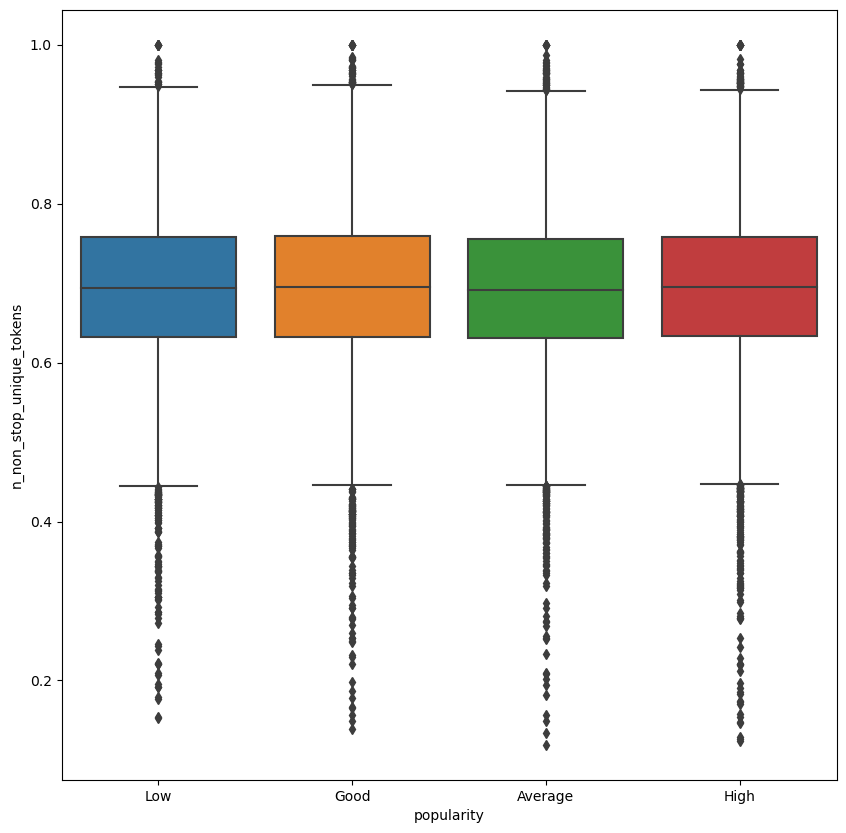

In [123]:
df['n_non_stop_unique_tokens'].describe()

temp_data = df[df['shares'] <= 100000]
fig, axes = plt.subplots(figsize=(10,10))

sns.boxplot(x='popularity', y='n_non_stop_unique_tokens', data=df, ax=axes)

Box plot shows majority (75%) of the data inrespective of their shares is in the range of 0.6 - 0.8.

<h3>To find relationship between variables we use pairplot 

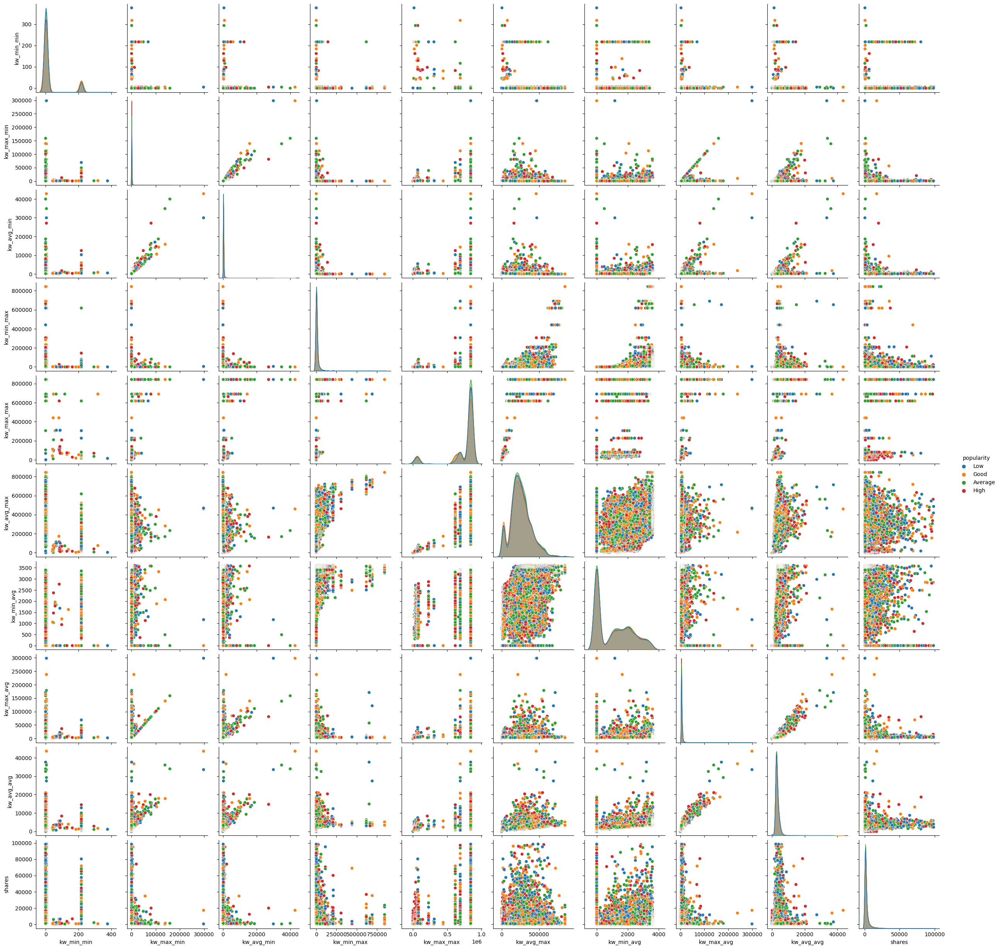

In [124]:
df['kw_min_min'].describe()
temp_data = df[df['shares'] <= 100000]

kw_cols = ['kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

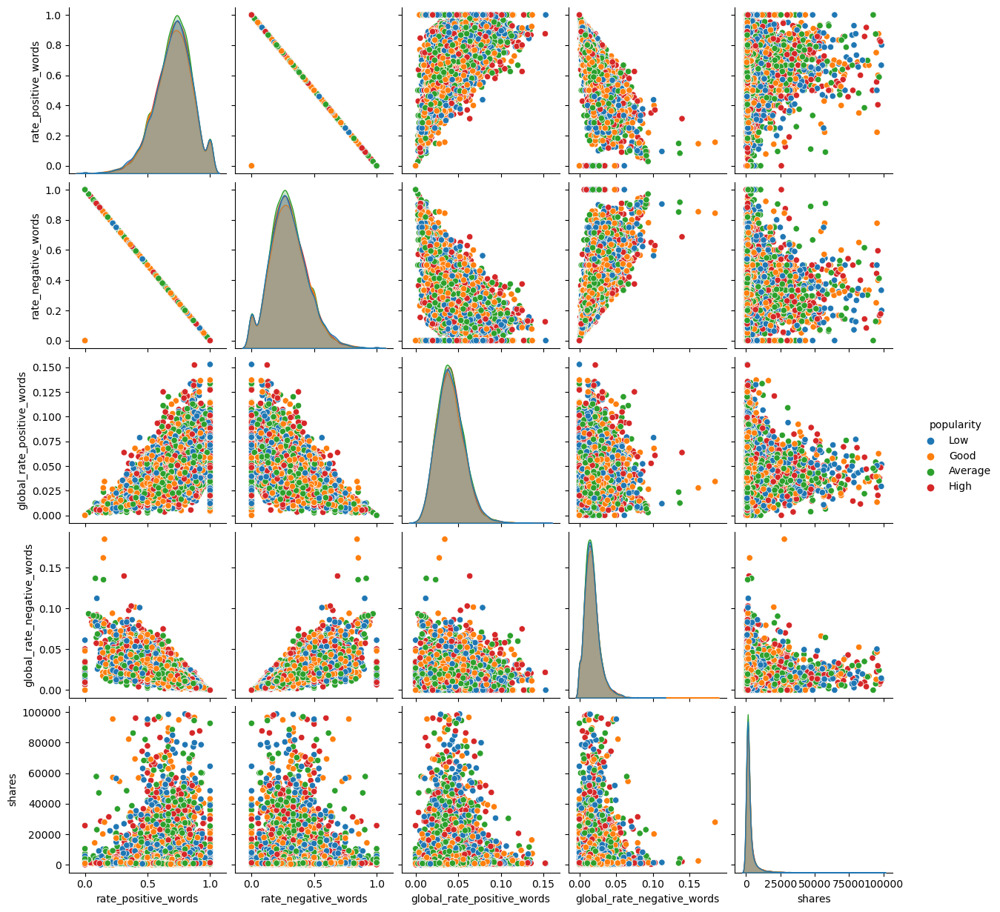

In [125]:
temp_data = df[df['shares'] <= 100000]

kw_cols = ['rate_positive_words', 'rate_negative_words', 'global_rate_positive_words', 'global_rate_negative_words', 'shares']
# run a pairplot
sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

Some of the inferences from above are:-
<li>There is a linear relationship between rate_positive_words and rate_negative_words
<li>rate_positive_words = No special relationship or observable trait was observed for this variable. Although most of articles tends to be on falls towards the 0.3 - 1
<li>rate_negative_words = No special relationship or observable trait was observed for this variable. Although most of articles tends to be on falls towards the 0.8 - 0 = Note the articles with popularity less than "average" have the lowest negative score rate.
<li>global_rate_positive_words - There is a slight relationship with shares. - Medium
<li>global_rate_negative_words - There is a slight relationship with shares. - Medium

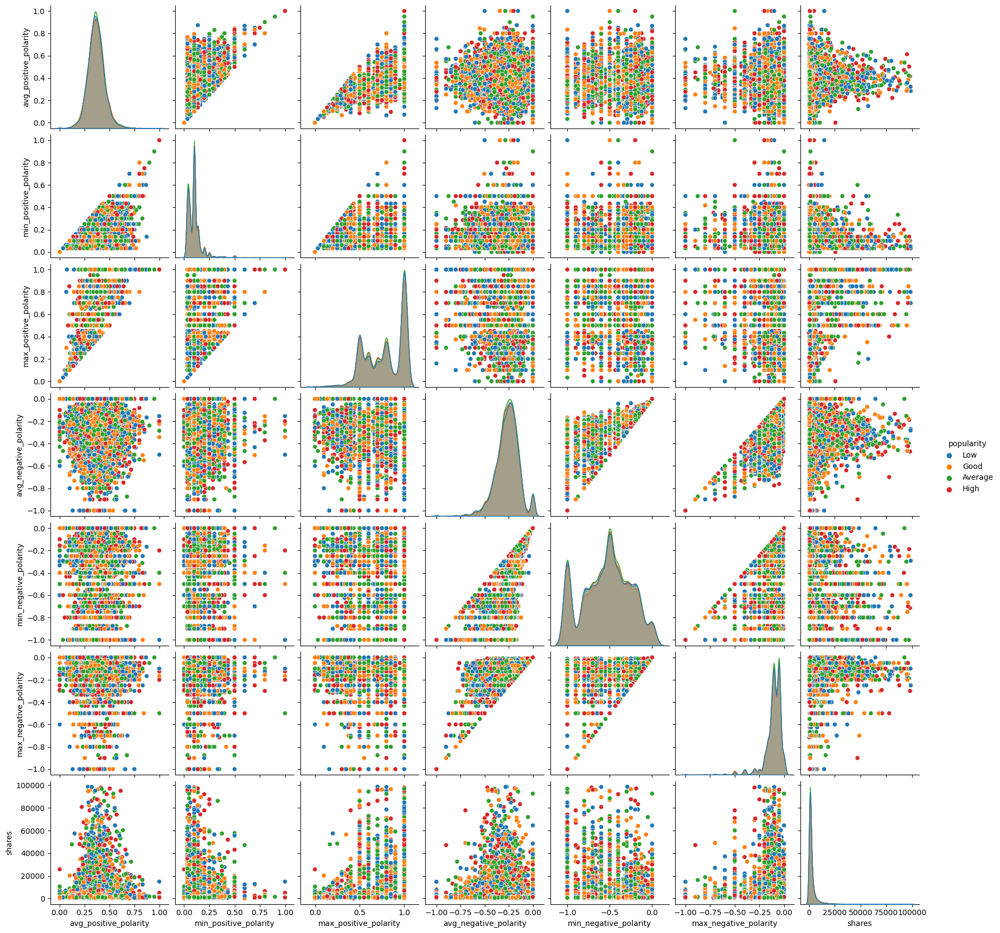

In [126]:
temp_data = df[df['shares'] <= 100000]

kw_cols = ['avg_positive_polarity', 'min_positive_polarity', 'max_positive_polarity', 'avg_negative_polarity', 'min_negative_polarity', 'max_negative_polarity', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

avg_positive_polarity and avg_negative_polarity are good features as seen in above plots

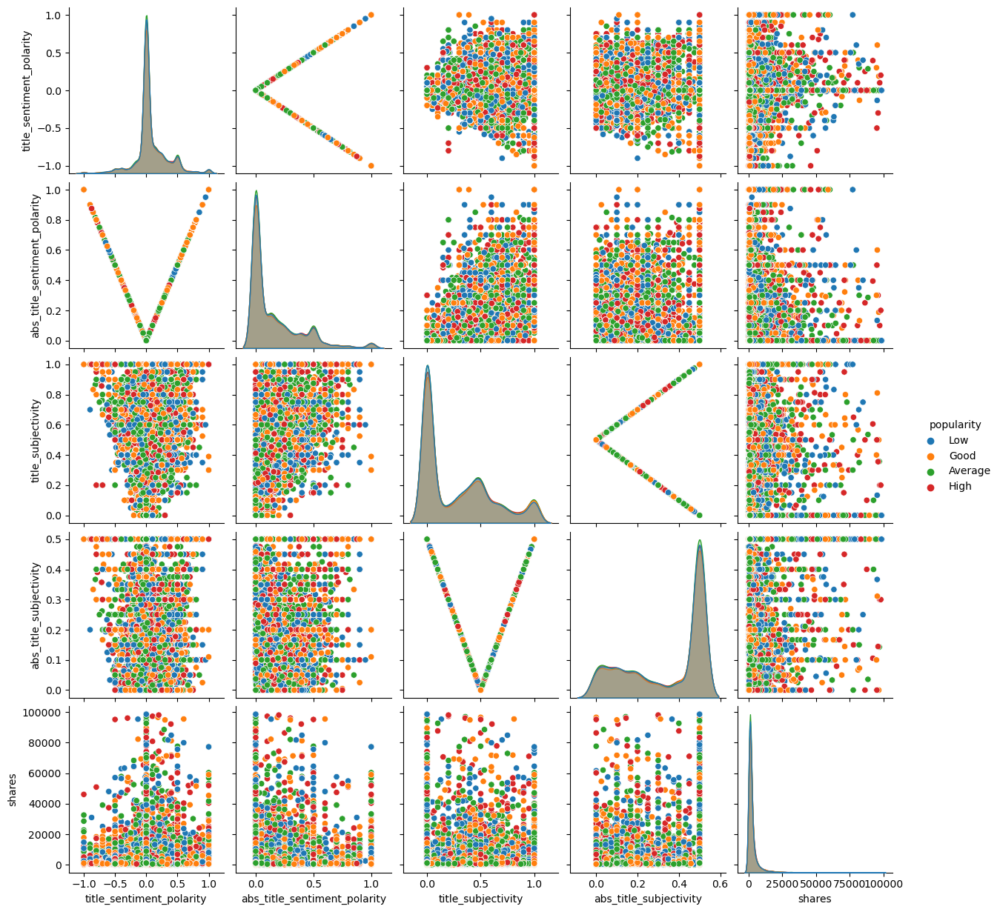

In [127]:
temp_data = df[df['shares'] <= 100000]

kw_cols = ['title_sentiment_polarity', 'abs_title_sentiment_polarity', 'title_subjectivity', 'abs_title_subjectivity', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

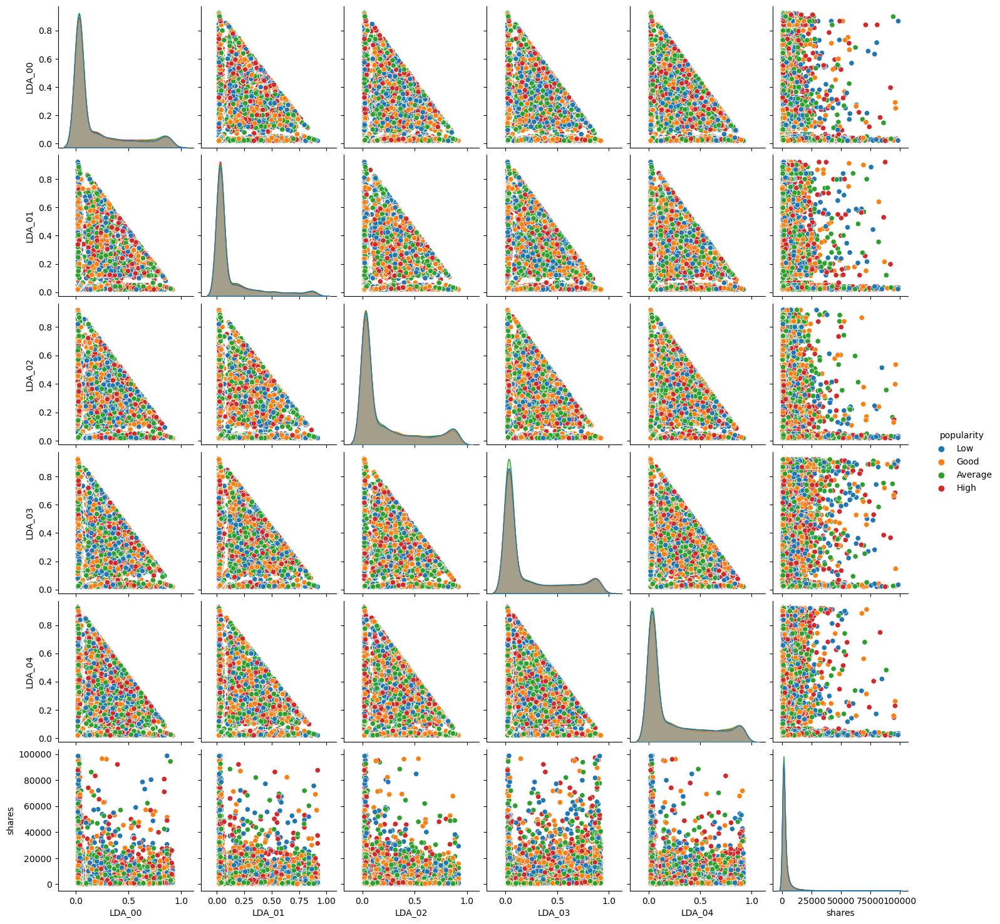

In [128]:
temp_data = df[df['shares'] <= 100000]

kw_cols = ['LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

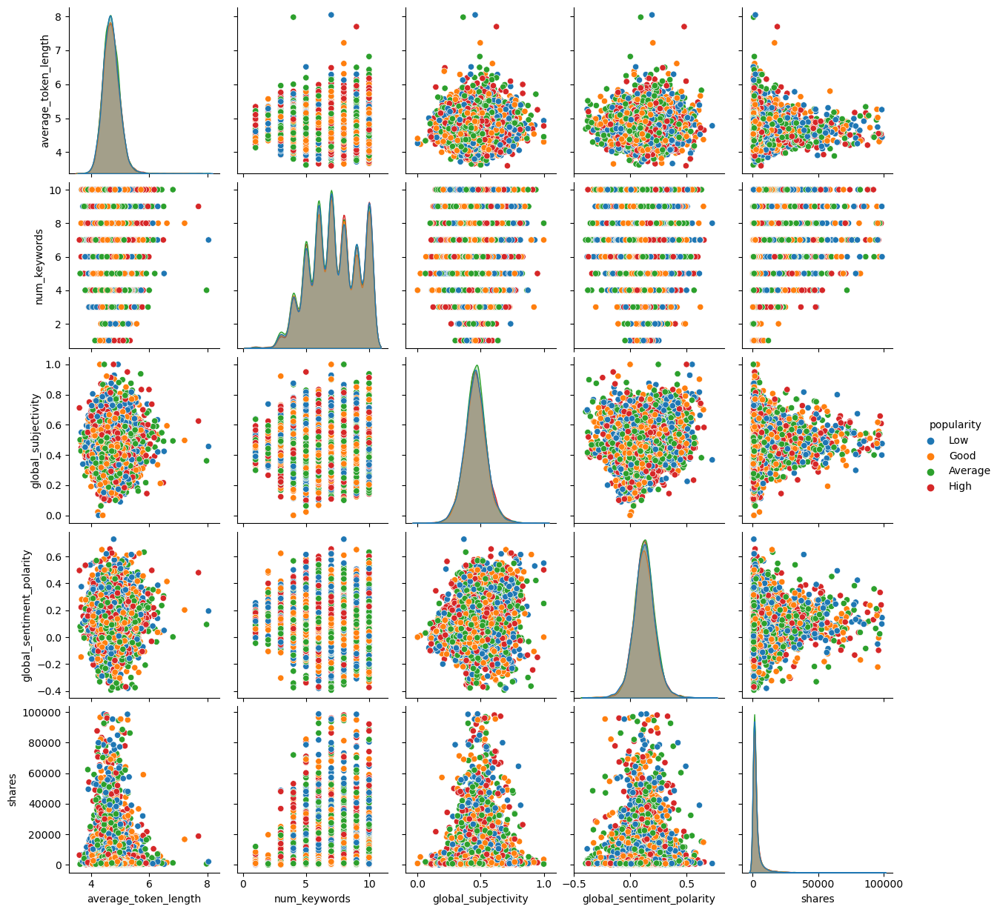

In [129]:
temp_data = df[df['shares'] <= 100000]

kw_cols = ['average_token_length', 'num_keywords', 'global_subjectivity', 'global_sentiment_polarity', 'shares']

sns.pairplot(temp_data, vars=kw_cols, hue='popularity', diag_kind='kde')

<h3>Impact of Weekdays

In [130]:
weekdays_data = df.groupby('weekdays').size().reset_index()
weekdays_data.columns = ['weekdays','count']
weekdays_data

,weekdays,count
0,Friday,5381
1,Monday,6291
2,Saturday,2302
3,Sunday,2589
4,Thursday,6871
5,Tueday,6982
6,Wednesday,6991


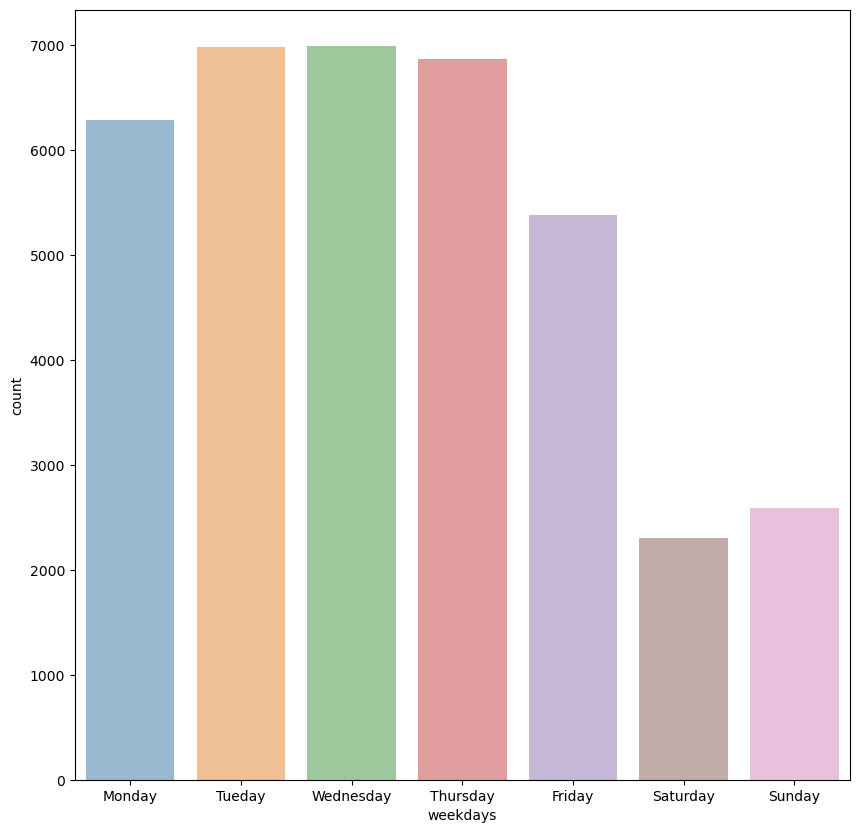

In [131]:
fig, axes = plt.subplots(figsize=(10,10))
ax = sns.countplot(x='weekdays',data=df,alpha=0.5, ax=axes)

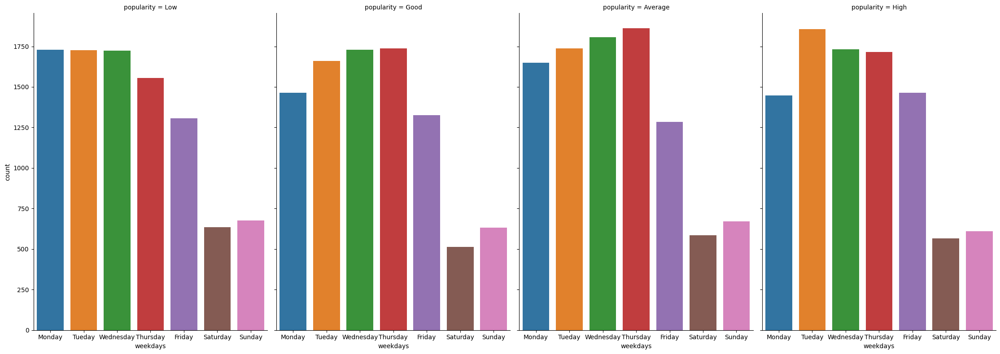

In [132]:
conditions = ['Low', 'Average', 'Good', 'High']

temp_data = df[df['popularity'].isin(conditions)]

ax = sns.catplot(x='weekdays', col="popularity", data=temp_data, kind="count", height=8, aspect=.7, col_wrap=4)


From above plots we can see Tuesday, Wednesday and Thursday are the days when popular articles are published. Whereas, the Weekends are worst time to publish an article.

<h3>Impact of Data Channel

In [133]:
data_channel_data = df.groupby('data_channel').size().reset_index()
data_channel_data.columns = ['Data Channels','No of articles']
data_channel_data

,Data Channels,No of articles
0,Business,6115
1,Entertainment,6677
2,Lifestyle,2016
3,Others,5371
4,Social Media,2275
5,Tech,7181
6,World,7772


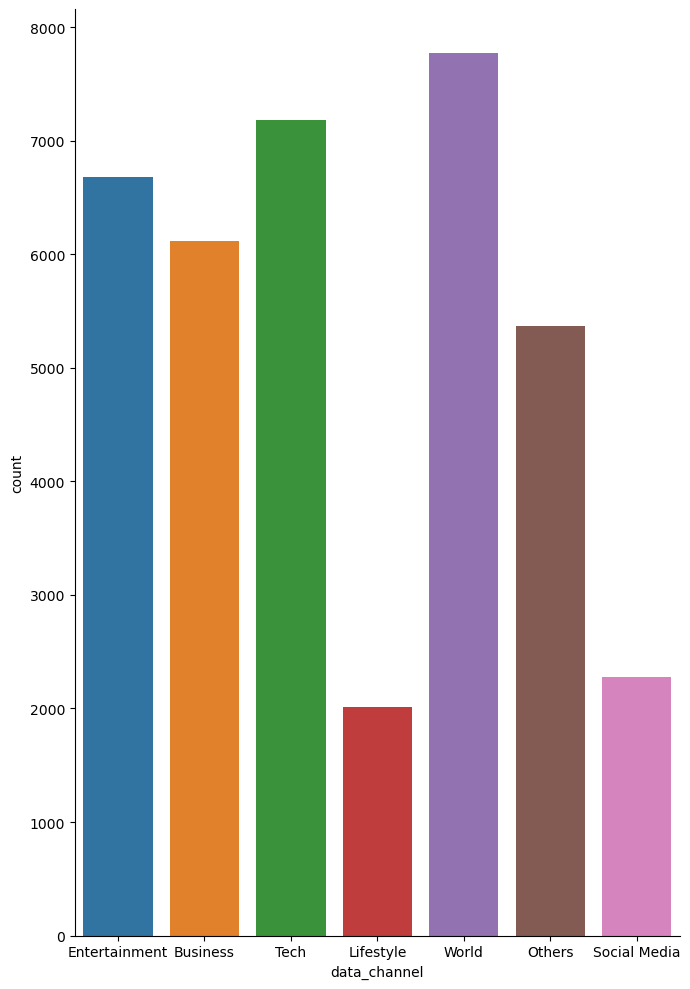

In [134]:
sns.catplot(x='data_channel', data=df, kind="count", height=10, aspect=.7)

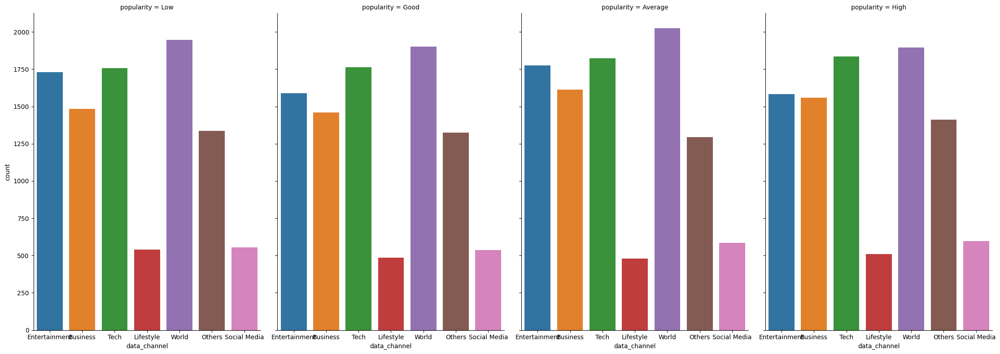

In [135]:
conditions = ['Low', 'Average', 'Good', 'High']

temp_data = df[df['popularity'].isin(conditions)]

ax = sns.catplot(x='data_channel', col="popularity", data=temp_data, kind="count", height=8, aspect=.7, col_wrap=4)


Here, "Tech" and "World" data channel tend to produce best articles followed by "Entertainment" and "Business". "Others", "Lifestyle" and "Social Media" produce articles that are not very popular.

<h3>Relationship of Data Channel, Number of Images and Popularity

We keep a threshold of 15 as 75% of the data lies there for num_hrefs

In [136]:
df['num_hrefs'].describe()

count    37407.000000
mean        11.208597
std         11.242341
min          0.000000
25%          5.000000
50%          8.000000
75%         14.000000
max        187.000000
Name: num_hrefs, dtype: float64

<AxesSubplot:xlabel='popularity', ylabel='num_imgs'>

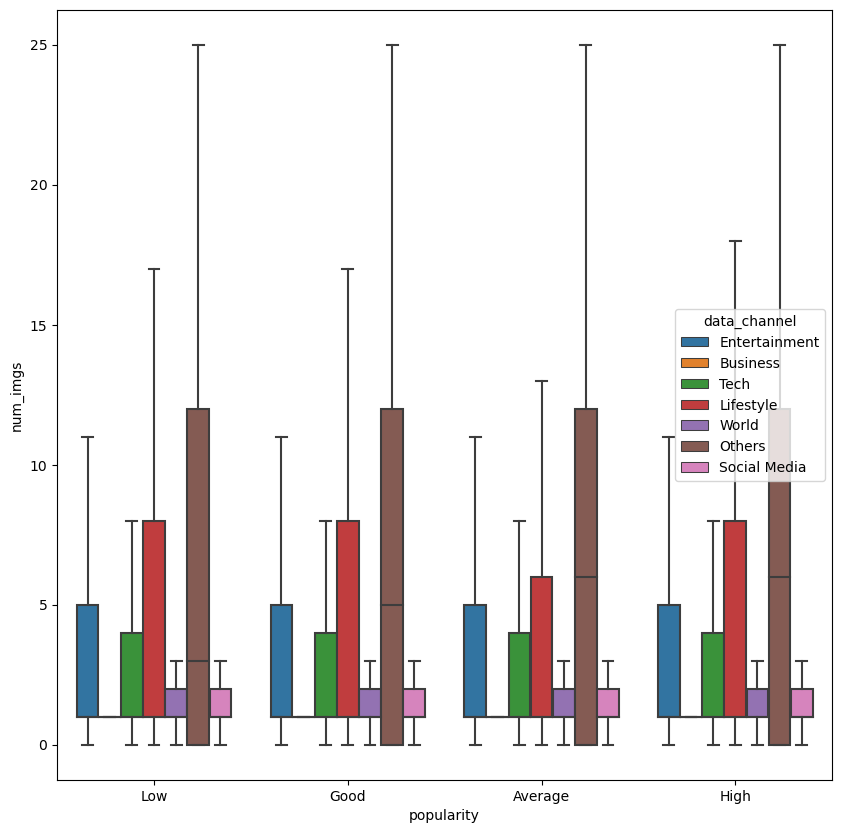

In [137]:
fig,ax = plt.subplots(figsize=(10,10))
temp_data = df[df['num_imgs'] <= 25]
sns.boxplot(x='popularity',y='num_imgs', hue='data_channel', data=temp_data, showfliers=False)

From above boxplot we can infer that good articles tend to have high visuals (num_images) in them but it is not always the case everytime. Those rare cases where the high visuals or low visuals doesn't change anything is in the Business channel. From the plot below, we can see that Business channels generally don't get influnece by the num_images in them. They are generally low inrespective of the popularity. This is peculiar pattern. Lifestyle channels generally tend to have high visuals as their popularity increases, with the only exception in 'Average' popularity.

<AxesSubplot:xlabel='n_tokens_content', ylabel='popularity'>

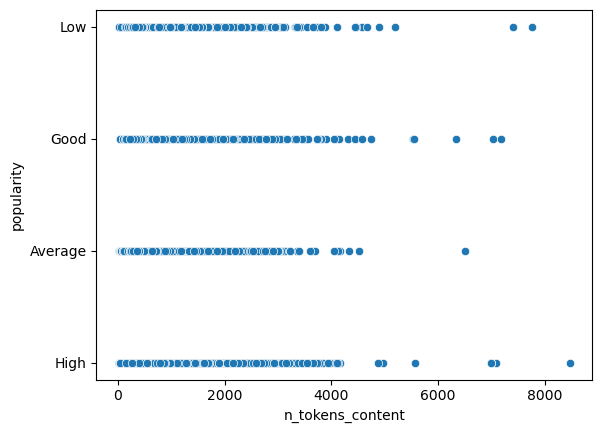

In [138]:
#n_tokens_content
sns.scatterplot(x='n_tokens_content',y='popularity', data=df)

<AxesSubplot:xlabel='n_tokens_title', ylabel='shares'>

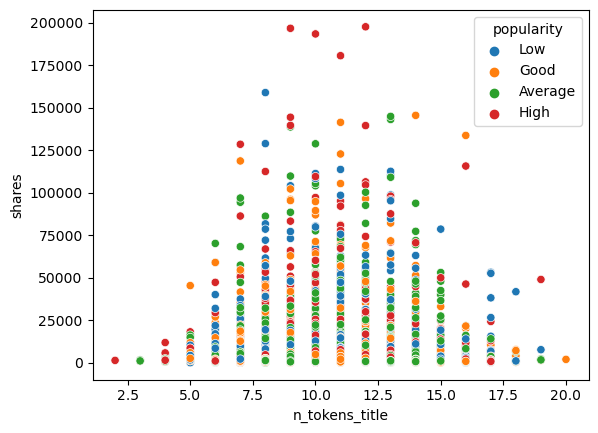

In [139]:
#n_tokens_title
temp_data = df[df['shares'] <= 200000]
sns.scatterplot(x='n_tokens_title',y='shares', hue='popularity', data=temp_data)

<AxesSubplot:xlabel='n_unique_tokens', ylabel='shares'>

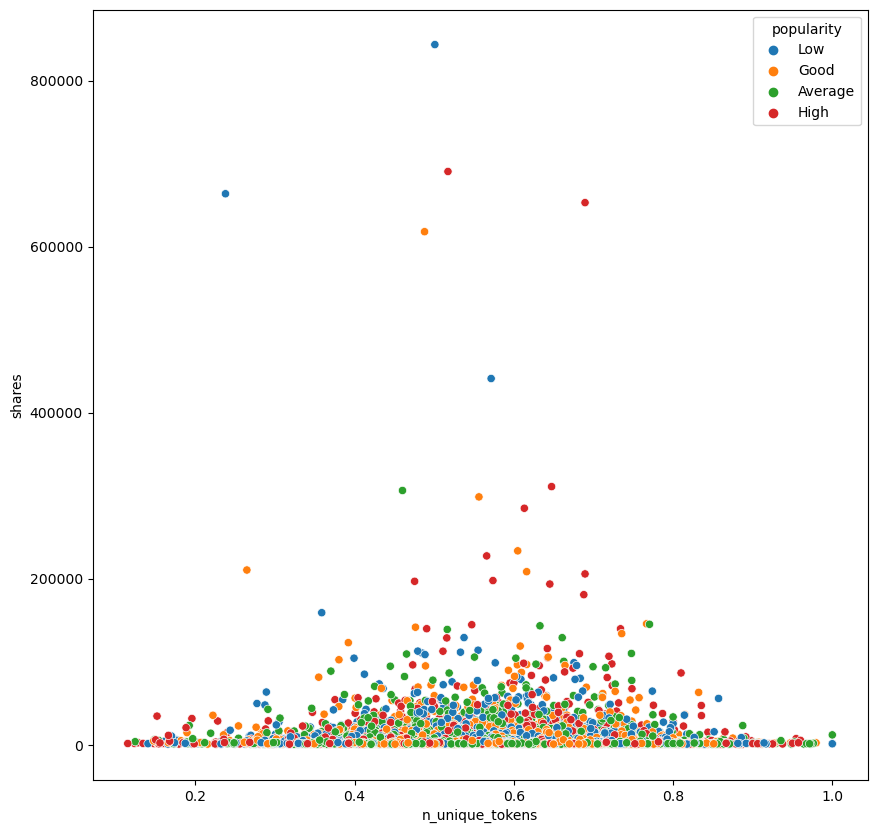

In [140]:
#n_tokens_title
temp_data = df[df['shares'] <= 200000]
plt.figure(figsize=(10,10))
sns.scatterplot(x='n_unique_tokens',y='shares', hue='popularity', data=df)

<AxesSubplot:xlabel='num_hrefs', ylabel='shares'>

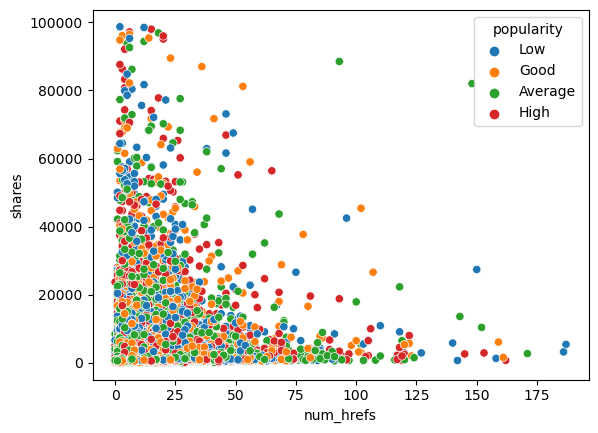

In [141]:
#num_hrefs
temp_data = df[df['shares'] <= 100000]
sns.scatterplot(x='num_hrefs',y='shares', hue='popularity', data=temp_data)

(0, 62)


<AxesSubplot:xlabel='average_token_length', ylabel='shares'>

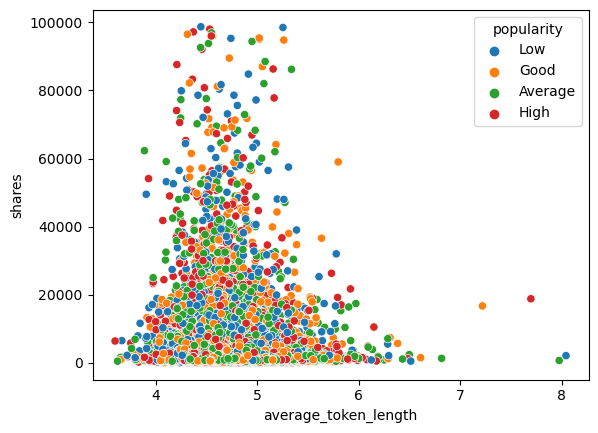

In [142]:
#average_token_length
temp_data = df[df['shares'] <= 100000]
noise_data  = df[df['average_token_length'] == 0]
print (noise_data.shape)
sns.scatterplot(x='average_token_length',y='shares', hue='popularity', data=temp_data)

(0, 62)


<AxesSubplot:xlabel='num_keywords', ylabel='shares'>

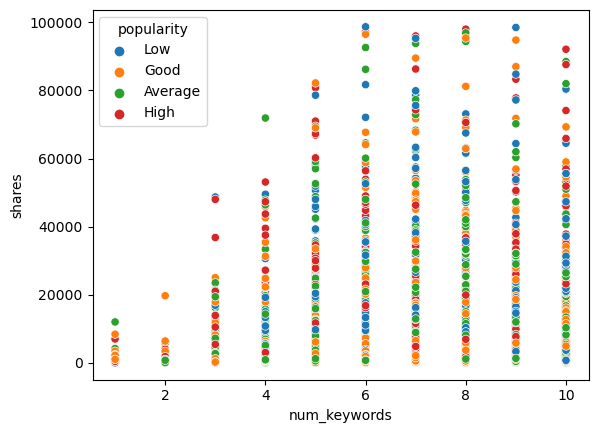

In [143]:
#num_keywords
temp_data = df[df['shares'] <= 100000]
noise_data  = df[df['num_keywords'] == 0]
print (noise_data.shape)
#plt.figure(figsize=(30,10))
sns.scatterplot(x='num_keywords',y='shares', hue='popularity', data=temp_data)

# Final Analysis
 - n_tokens_content should be less than 2000 words. The lesser the better.
 - n_tokens_title should be between 6 - 17 words. 
 - n_unique_tokens should be between 0.4 - 0.8
 - num_hrefs is between 1 and 50 referrence links
 - average_token_length should be between 4 - 6
 - The number of keywords in the metedata really influences the shares to a margin. The higher the value the better the shares chances. A value upward of 5 is recommended.
 - Here, it can be seen that the best articles with highest share popularity belongs to the "World" and "Tech" channel. For a more concrete channel, The "Business" and "Entertaiment" channel are great for the best popularity. Followed by "Others".
 - Best popular articles are usually posted on Tuesday, Wednesday and Thursday. Sundays and Saturdays (Weekends generally) are the worsts days to publish an articles.

# Normal Distribution of Shares

In [144]:
print("Skewness: %f" % df['shares'].skew())
print("Kurtosis: %f" % df['shares'].kurt())

Skewness: 34.744251
Kurtosis: 1878.562213


c:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


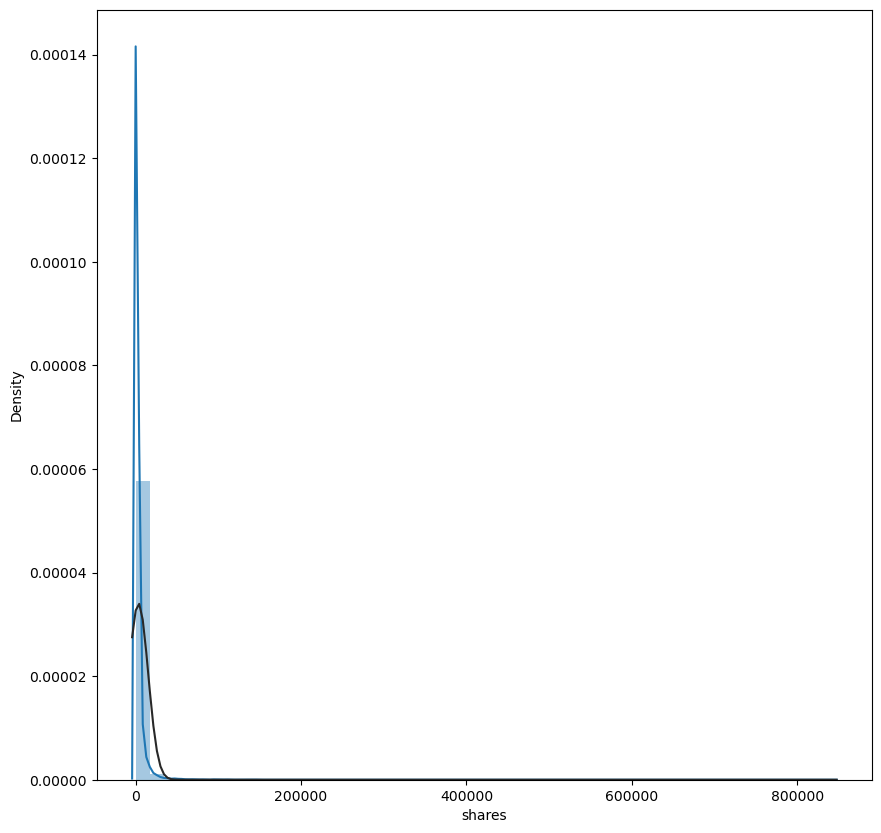

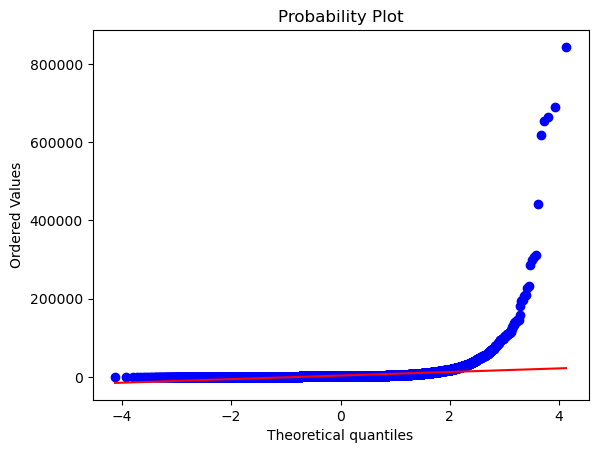

In [145]:
temp_data = df[df['shares'] <= 100000]
fig,ax = plt.subplots(figsize=(10,10))
sns.distplot(df['shares'], fit=norm);
fig = plt.figure()
res = probplot(df['shares'], plot=plt)

'Shares' doesn't have a normal distribution. It shows 'peakedness', positive skewness and does not follow the diagonal line. Thus some statistic analysis might not be suitable for it.
<br>Thus we apply the Log Transformation to it.

c:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


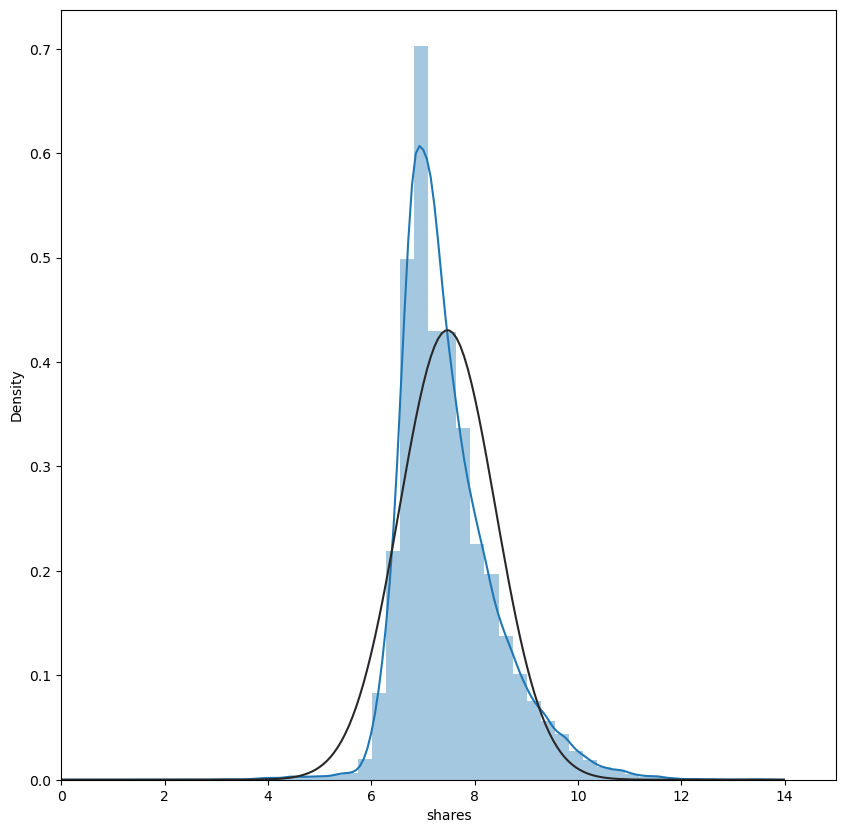

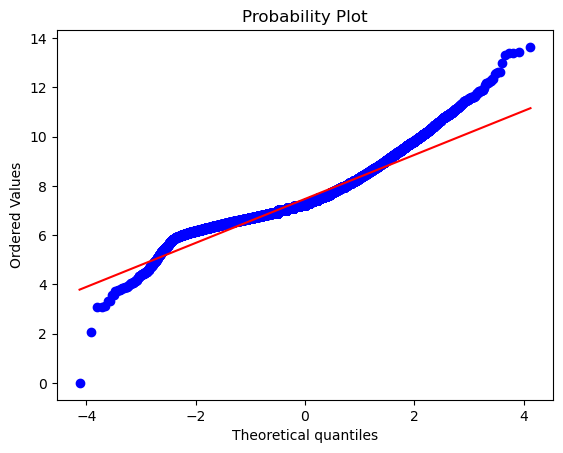

In [146]:
new_shares_data = df.copy()

# Applying the log transformation
new_shares_data.loc[new_shares_data['shares'] > 0, 'shares'] = np.log(df.loc[df['shares'] > 0, 'shares'])
new_shares_log = new_shares_data['shares']

# Transformed histogram and normal probability plot
fig, ax = plt.subplots(figsize=(10,10))
sns.distplot(new_shares_log, fit=norm)
ax.set_xlim([0, 15])
plt.show()

# Probability plot
fig = plt.figure()
res = probplot(new_shares_log, plot=plt)
plt.show()

Checking for missing data

In [147]:
total = new_shares_data.isnull().sum().sort_values(ascending=False)
percent = (new_shares_data.isnull().sum()/new_shares_data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

,Total,Percent
n_tokens_title,0,0.0
global_rate_positive_words,0,0.0
weekday_is_wednesday,0,0.0
weekday_is_thursday,0,0.0
weekday_is_friday,0,0.0


As all the visualisation done we will drop the data channel, weekend, popularity columns

In [153]:
df = df.drop(columns=['weekdays', 'data_channel', 'popularity'])

# Feature Selection
- Variance Threshold
- PCA
- L1 Regularisation(Lasso)

Variance Threshold

In [156]:
selector = VarianceThreshold(threshold=0.8)
selector.fit_transform(df)
high_var_features = df.columns[selector.get_support()].tolist()

In [157]:
high_var_features

['n_tokens_title',
 'n_tokens_content',
 'num_hrefs',
 'num_self_hrefs',
 'num_imgs',
 'num_videos',
 'num_keywords',
 'kw_min_min',
 'kw_max_min',
 'kw_avg_min',
 'kw_min_max',
 'kw_max_max',
 'kw_avg_max',
 'kw_min_avg',
 'kw_max_avg',
 'kw_avg_avg',
 'self_reference_min_shares',
 'self_reference_max_shares',
 'self_reference_avg_sharess',
 'shares']

L1 Regularisation(Lasso)

In [237]:
X = df.drop(['shares'], axis=1)
y = df['shares']
lasso = Lasso(alpha=0.001)
lasso.fit(X, y)
lasso_coef = lasso.coef_
X_columns = df.columns.tolist()
# selected_features_lasso = [col for i, col in enumerate(X_columns) if lasso_coef[i] != 0]
selected_features_lasso = [col for i, col in enumerate(X_columns[:len(lasso_coef)]) if lasso_coef[i] != 0]


c:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.492e+12, tolerance: 5.133e+08
  model = cd_fast.enet_coordinate_descent(


In [238]:
selected_features_lasso

['n_tokens_title',
 'n_tokens_content',
 'n_unique_tokens',
 'n_non_stop_unique_tokens',
 'num_hrefs',
 'num_self_hrefs',
 'num_imgs',
 'num_videos',
 'average_token_length',
 'num_keywords',
 'data_channel_is_lifestyle',
 'data_channel_is_entertainment',
 'data_channel_is_bus',
 'data_channel_is_socmed',
 'data_channel_is_tech',
 'data_channel_is_world',
 'kw_min_min',
 'kw_max_min',
 'kw_avg_min',
 'kw_min_max',
 'kw_max_max',
 'kw_avg_max',
 'kw_min_avg',
 'kw_max_avg',
 'kw_avg_avg',
 'self_reference_min_shares',
 'self_reference_max_shares',
 'self_reference_avg_sharess',
 'weekday_is_monday',
 'weekday_is_tuesday',
 'weekday_is_wednesday',
 'weekday_is_thursday',
 'weekday_is_friday',
 'weekday_is_saturday',
 'weekday_is_sunday',
 'is_weekend',
 'LDA_00',
 'LDA_01',
 'LDA_02',
 'LDA_03',
 'LDA_04',
 'global_subjectivity',
 'global_sentiment_polarity',
 'global_rate_positive_words',
 'global_rate_negative_words',
 'rate_positive_words',
 'rate_negative_words',
 'avg_positive_polar

PCA

In [193]:
X = df.drop(['shares'], axis=1)
y = df['shares']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [194]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit on training set only.
X_test_scaled = scaler.transform(X_test)

In [195]:
pca = PCA()
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [196]:
explained_variance = pca.explained_variance_ratio_

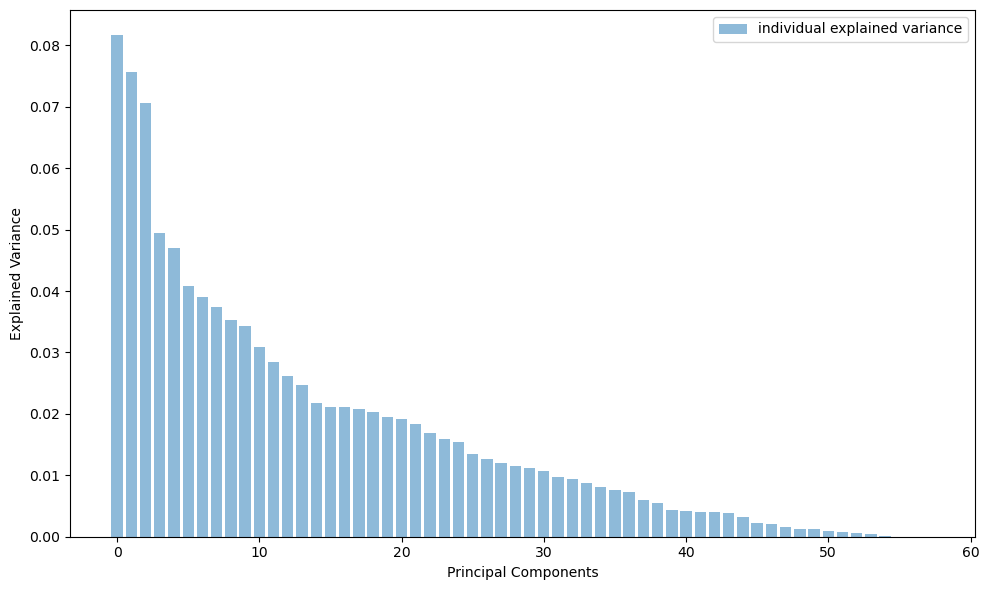

In [197]:
# Plot the explained variance
plt.figure(figsize=(10, 6))
plt.bar(range(len(explained_variance)), explained_variance, alpha=0.5, align='center', label='individual explained variance')
plt.ylabel('Explained Variance')
plt.xlabel('Principal Components')
plt.legend(loc='best')
plt.tight_layout()

In [198]:
# Decide the number of components; for example, you might want to keep enough components 
# that capture, say, 95% of the variance
cumulative_variance = explained_variance.cumsum()
num_components = (cumulative_variance <= 0.95).sum()

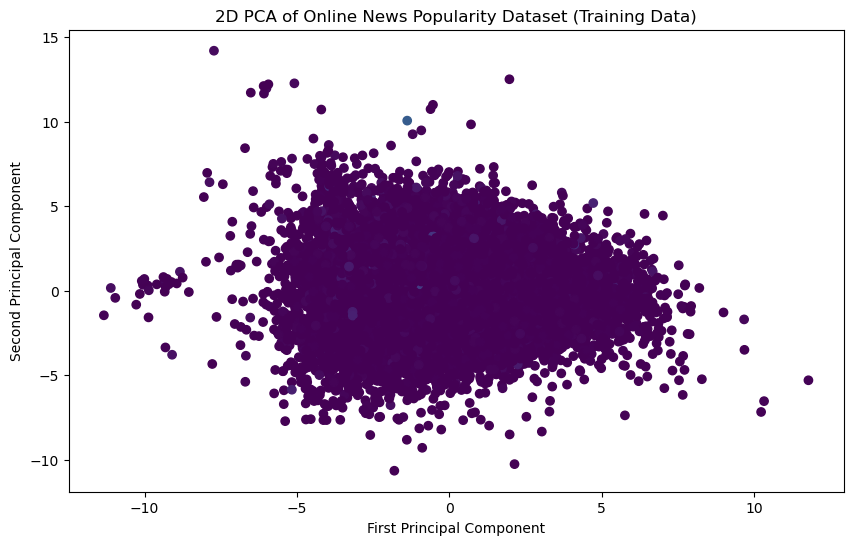

In [199]:
if X_train_pca.shape[1] >= 2:
    plt.figure(figsize=(10, 6))
    plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train)  # coloring by target variable for training data
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.title('2D PCA of Online News Popularity Dataset (Training Data)')
    plt.show()

In [200]:
X_train_pca_reduced = X_train_pca[:, :num_components]
X_test_pca_reduced = X_test_pca[:, :num_components]  # <-- for test data

In [201]:
# Get the feature names from the original dataset
feature_names = X.columns

# Display the feature loadings for each principal component
for i, component in enumerate(pca.components_):
    component_df = pd.DataFrame({'Feature': feature_names, f'PC{i+1}': component})
    print(component_df.sort_values(by=f'PC{i+1}', key=abs, ascending=False))
    print("\n" + "-"*50 + "\n")


                          Feature       PC1
47            rate_negative_words -0.344694
46            rate_positive_words  0.343936
43      global_sentiment_polarity  0.315833
52          min_negative_polarity  0.312004
45     global_rate_negative_words -0.276952
3                n_non_stop_words -0.245950
2                 n_unique_tokens  0.232235
1                n_tokens_content -0.223940
4        n_non_stop_unique_tokens  0.213331
51          avg_negative_polarity  0.196876
44     global_rate_positive_words  0.187499
39                         LDA_02 -0.147161
5                       num_hrefs -0.146273
16          data_channel_is_world -0.146215
7                        num_imgs -0.140053
41                         LDA_04  0.116023
15           data_channel_is_tech  0.109996
21                     kw_max_max -0.109617
17                     kw_min_min  0.102961
37                         LDA_00  0.097893
13            data_channel_is_bus  0.091707
55       title_sentiment_polarit

                          Feature      PC45
16          data_channel_is_world  0.508496
39                         LDA_02 -0.457351
37                         LDA_00  0.431890
13            data_channel_is_bus -0.430423
17                     kw_min_min  0.219282
22                     kw_avg_max  0.191564
41                         LDA_04  0.133671
12  data_channel_is_entertainment  0.110593
21                     kw_max_max  0.097385
14         data_channel_is_socmed -0.073903
11      data_channel_is_lifestyle -0.068734
15           data_channel_is_tech -0.065269
40                         LDA_03 -0.060093
24                     kw_max_avg -0.057504
20                     kw_min_max -0.051092
57   abs_title_sentiment_polarity -0.045579
54             title_subjectivity  0.041280
23                     kw_min_avg -0.035236
38                         LDA_01 -0.034583
3                n_non_stop_words -0.031460
18                     kw_max_min  0.023179
25                     kw_avg_av

# Test Train Split

In [244]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [239]:
X_lasso = df[selected_features_lasso]
X_high_var = df[high_var_features]

y = df['shares']


In [240]:
print(X_lasso.shape)
print(X_high_var.shape)
print(y.shape)


(37407, 57)
(37407, 20)
(37407,)


In [241]:
# Perform the test-train split for Lasso selected features
X_train_lasso, X_test_lasso, y_train, y_test = train_test_split(X_lasso, y, test_size=0.2, random_state=42)

# Perform the test-train split for high variance features
X_train_high_var, X_test_high_var, y_train, y_test = train_test_split(X_high_var, y, test_size=0.2, random_state=42)

# Regression Model Training and Testing

<h3>Linear Regression

In [246]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
mse_LR = mean_squared_error(y_test, y_pred, squared=False)
r2_LR = r2_score(y_test, y_pred)

print(f'Linear Regression MSE: {mse_LR}')
print(f'Linear Regression R2: {r2_LR}')

Linear Regression MSE: 14365.038566319172
Linear Regression R2: 0.01511195424555345


In [242]:
lin_reg = LinearRegression()

# Train on Lasso selected features
lin_reg.fit(X_train_lasso, y_train)
predictions_lasso = lin_reg.predict(X_test_lasso)

# Train on high variance features
lin_reg.fit(X_train_high_var, y_train)
predictions_high_var = lin_reg.predict(X_test_high_var)

In [243]:
# Performance on Lasso selected features
rmse_lasso_LR = mean_squared_error(y_test, predictions_lasso, squared=False)
r2_lasso_LR = r2_score(y_test, predictions_lasso)

print("Performance using Lasso selected features:")
print("RMSE:", rmse_lasso_LR)
print("R2 Score:", r2_lasso_LR)

# Performance on high variance features
rmse_high_var_LR = mean_squared_error(y_test, predictions_high_var, squared=False)
r2_high_var_LR = r2_score(y_test, predictions_high_var)

print("\nPerformance using high variance features:")
print("RMSE:", rmse_high_var_LR)
print("R2 Score:", r2_high_var_LR)

Performance using Lasso selected features:
RMSE: 14365.008884861372
R2 Score: 0.015116024249630655

Performance using high variance features:
RMSE: 1.5946560372058442e-11
R2 Score: 1.0


In [203]:
lr = LinearRegression()

# Fitting the model to the PCA transformed training data
lr.fit(X_train_pca_reduced, y_train)

# Making predictions
y_train_pred = lr.predict(X_train_pca_reduced)
y_test_pred = lr.predict(X_test_pca_reduced)

# Calculating the RMSE and R^2 values
rmse_train_PCA_LR = mean_squared_error(y_train, y_train_pred, squared=False)
r2_train_PCA_LR = r2_score(y_train, y_train_pred)

rmse_test_PCA_LR = mean_squared_error(y_test, y_test_pred, squared=False)
r2_test_PCA_LR = r2_score(y_test, y_test_pred)

print(f"Training RMSE: {rmse_train_PCA_LR:.4f}")
print(f"Training R^2: {r2_train_PCA_LR:.4f}")

print(f"Test RMSE: {rmse_test_PCA_LR:.4f}")
print(f"Test R^2: {r2_test_PCA_LR:.4f}")

Training RMSE: 10807.2350
Training R^2: 0.0198
Test RMSE: 14373.4105
Test R^2: 0.0140


<h3>Decision Tree Regressor

In [249]:
tree = DecisionTreeRegressor(max_depth=10)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)

mse_DTR = mean_squared_error(y_test, y_pred, squared=False)
r2_DTR = r2_score(y_test, y_pred)

print(f'Decision Tree MSE: {mse_DTR}')
print(f'Decision Tree R^2: {r2_DTR}')

Decision Tree MSE: 15457.039985893354
Decision Tree R^2: -0.14031788088136454


In [251]:
tree.fit(X_train_lasso, y_train)

y_pred = tree.predict(X_test_lasso)

mse_L1_DTR = mean_squared_error(y_test, y_pred, squared=False)
r2_L1_DTR = r2_score(y_test, y_pred)

print(f'Decision Tree MSE (L1 Regularisation): {mse_L1_DTR}')
print(f'Decision Tree R^2 (L1 Regularisation): {r2_L1_DTR}')

tree.fit(X_train_high_var, y_train)

y_pred = tree.predict(X_test_high_var)

mse_VT_DTR = mean_squared_error(y_test, y_pred, squared=False)
r2_VT_DTR = r2_score(y_test, y_pred)

print(f'Decision Tree MSE (Variance Threshold): {mse_VT_DTR}')
print(f'Decision Tree R^2 (Variance Threshold): {r2_VT_DTR}')

Decision Tree MSE: 15045.29232939279
Decision Tree R^2: -0.08037502120187967
Decision Tree MSE: 3034.158347286159
Decision Tree R^2: 0.9560610415732308


In [252]:
tree.fit(X_train_pca_reduced, y_train)  # Use PCA-transformed training data

y_pred = tree.predict(X_test_pca_reduced)  # Use PCA-transformed test data

mse_PCA_DTR = mean_squared_error(y_test, y_pred, squared=False)
r2_PCA_DTR = r2_score(y_test, y_pred)

print(f'Decision Tree MSE: {mse_PCA_DTR}')
print(f'Decision Tree R^2: {r2_PCA_DTR}')

Decision Tree MSE: 15757.453788627377
Decision Tree R^2: -0.18507369407022534


In [259]:
tree_params = {
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

tree_search = GridSearchCV(DecisionTreeRegressor(), tree_params, cv=5, scoring='neg_mean_squared_error')
tree_search.fit(X_train, y_train)
print("Best parameters for Decision Tree:", tree_search.best_params_)


Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}


In [260]:
tree_params = {
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

tree_search = GridSearchCV(DecisionTreeRegressor(), tree_params, cv=5, scoring='neg_mean_squared_error')
tree_search.fit(X_train_lasso, y_train)
print("Best parameters for Decision Tree:", tree_search.best_params_)

Best parameters for Decision Tree: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}


In [261]:
tree_params = {
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

tree_search = GridSearchCV(DecisionTreeRegressor(), tree_params, cv=5, scoring='neg_mean_squared_error')
tree_search.fit(X_train_high_var, y_train)
print("Best parameters for Decision Tree:", tree_search.best_params_)

Best parameters for Decision Tree: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 5}


In [274]:
tree = DecisionTreeRegressor(max_depth=10, min_samples_leaf=4, min_samples_split=10)
tree.fit(X_train, y_train)

y_pred = tree.predict(X_test)

mse_DTR_GS = mean_squared_error(y_test, y_pred, squared=False)
r2_DTR_GS = r2_score(y_test, y_pred)

print(f'Decision Tree MSE: {mse_DTR_GS}')
print(f'Decision Tree R^2: {r2_DTR_GS}')

Decision Tree MSE: 14984.50529718707
Decision Tree R^2: -0.07166264501228192


In [275]:
tree.fit(X_train_lasso, y_train)

y_pred = tree.predict(X_test_lasso)

mse_L1_DTR_GS = mean_squared_error(y_test, y_pred, squared=False)
r2_L1_DTR_GS = r2_score(y_test, y_pred)

print(f'Decision Tree MSE (L1 Regularisation): {mse_L1_DTR_GS}')
print(f'Decision Tree R^2 (L1 Regularisation): {r2_L1_DTR_GS}')

tree = DecisionTreeRegressor(max_depth=30, min_samples_leaf=1, min_samples_split=5)
tree.fit(X_train_high_var, y_train)

y_pred = tree.predict(X_test_high_var)

mse_VT_DTR_GS = mean_squared_error(y_test, y_pred, squared=False)
r2_VT_DTR_GS = r2_score(y_test, y_pred)

print(f'Decision Tree MSE (Variance Threshold): {mse_VT_DTR_GS}')
print(f'Decision Tree R^2 (Variance Threshold): {r2_VT_DTR_GS}')

Decision Tree MSE (L1 Regularisation): 14984.50529718707
Decision Tree R^2 (L1 Regularisation): -0.07166264501228192
Decision Tree MSE (Variance Threshold): 2847.627082973443
Decision Tree R^2 (Variance Threshold): 0.9612974568921122


<h3>Random Forest Regressor

In [276]:
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
mse_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_RFR = r2_score(y_test, y_pred)
print(f'Random Forest MSE: {mse_RFR}')
print(f'Random Forest R^2: {r2_RFR}')

Random Forest MSE: 14494.783326553885
Random Forest R^2: -0.002759370554519025


In [256]:
rf.fit(X_train_lasso, y_train)

y_pred = rf.predict(X_test_lasso)

mse_L1_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_L1_RFR = r2_score(y_test, y_pred)

print(f'Random Forest MSE (L1 Regularisation): {mse_L1_RFR}')
print(f'Random Forest R^2 (L1 Regularisation): {r2_L1_RFR}')

rf.fit(X_train_high_var, y_train)

y_pred = rf.predict(X_test_high_var)

mse_VT_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_VT_RFR = r2_score(y_test, y_pred)

print(f'Random Forest MSE (Variance Threshold): {mse_VT_RFR}')
print(f'Random Forest R^2 (Variance Threshold): {r2_VT_RFR}')

Decision Tree MSE (L1 Regularisation): 14486.858422816009
Decision Tree R^2 (L1 Regularisation): -0.0016631694056101765
Decision Tree MSE (Variance Threshold): 3453.185152084437
Decision Tree R^2 (Variance Threshold): 0.9430868002104874


In [278]:
rf.fit(X_train_pca_reduced, y_train)

y_pred = rf.predict(X_test_pca_reduced)
mse_PCA_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_PCA_RFR = r2_score(y_test, y_pred)
print(f'Random Forest MSE using PCA: {mse_PCA_RFR}')
print(f'Random Forest R^2 using PCA: {r2_PCA_RFR}')

Random Forest MSE using PCA: 14508.75156420428
Random Forest R^2 using PCA: -0.004692966919477959


In [273]:
rf_dist = {
    'n_estimators': randint(10, 200),
    'max_depth': [None] + list(randint(1, 20).rvs(10)),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10)
}
rf_search = RandomizedSearchCV(RandomForestRegressor(), param_distributions=rf_dist, 
                               n_iter=50, scoring='neg_mean_squared_error', 
                               n_jobs=-1, cv=5, random_state=42)
rf_search.fit(X_train, y_train)
print("Best parameters for Random Forest:", rf_search.best_params_)

Best parameters for Random Forest: {'max_depth': 4, 'min_samples_leaf': 8, 'min_samples_split': 6, 'n_estimators': 109}


In [279]:
rf = RandomForestRegressor(n_estimators=109, max_depth=4, min_samples_split=6, min_samples_leaf=8)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
mse_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_RFR = r2_score(y_test, y_pred)
print(f'Random Forest MSE: {mse_RFR}')
print(f'Random Forest R^2: {r2_RFR}')

Random Forest MSE: 14366.173358199916
Random Forest R^2: 0.014956342118554455


In [272]:
rf_dist = {
    'n_estimators': randint(10, 200),
    'max_depth': [None] + list(randint(1, 20).rvs(10)),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10)
}
rf_search = RandomizedSearchCV(RandomForestRegressor(), param_distributions=rf_dist, 
                               n_iter=50, scoring='neg_mean_squared_error', 
                               n_jobs=-1, cv=5, random_state=42)
rf_search.fit(X_train_lasso, y_train)
print("Best parameters for Random Forest:", rf_search.best_params_)

Best parameters for Random Forest: {'max_depth': 11, 'min_samples_leaf': 9, 'min_samples_split': 6, 'n_estimators': 143}


In [280]:
rf = RandomForestRegressor(max_depth=11, min_samples_leaf=9, min_samples_split=6, n_estimators=143)

rf.fit(X_train_lasso, y_train)

y_pred = rf.predict(X_test_lasso)

mse_L1_RFR = mean_squared_error(y_test, y_pred, squared=False)
r2_L1_RFR = r2_score(y_test, y_pred)

print(f'Random Forest MSE (L1 Regularisation): {mse_L1_RFR}')
print(f'Random Forest R^2 (L1 Regularisation): {r2_L1_RFR}')

Random Forest MSE (L1 Regularisation): 14363.470715699988
Random Forest R^2 (L1 Regularisation): 0.015326930774556935


In [271]:
rf_dist = {
    'n_estimators': randint(10, 200),
    'max_depth': [None] + list(randint(1, 20).rvs(10)),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10)
}
rf_search = RandomizedSearchCV(RandomForestRegressor(), param_distributions=rf_dist, 
                               n_iter=50, scoring='neg_mean_squared_error', 
                               n_jobs=-1, cv=5, random_state=42)
rf_search.fit(X_train_high_var, y_train)
print("Best parameters for Random Forest:", rf_search.best_params_)

Best parameters for Random Forest: {'max_depth': 16, 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 151}


In [277]:
rf = RandomForestRegressor(max_depth=16, min_samples_leaf=1, min_samples_split=6, n_estimators=151)

rf.fit(X_train_high_var, y_train)

y_pred = rf.predict(X_test_high_var)

mse_VT_RFR_RS = mean_squared_error(y_test, y_pred, squared=False)
r2_VT_RFR_RS = r2_score(y_test, y_pred)

print(f'Random Forest RMSE (Variance Threshold): {mse_VT_RFR_RS}')
print(f'Random Forest R^2 (Variance Threshold): {r2_VT_RFR_RS}')

Random Forest RMSE (Variance Threshold): 3556.872736271879
Random Forest R^2 (Variance Threshold): 0.9396176617490556
